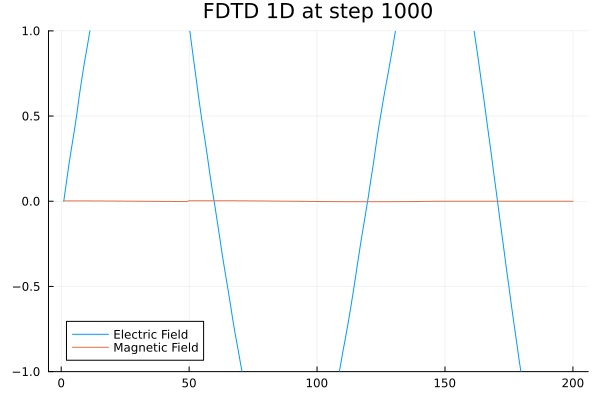

In [3]:
# Import necessary packages
using Plots

# Constants
ε0 = 8.854187817e-12  # Permittivity of free space
μ0 = 1.256637061e-6   # Permeability of free space
c = 1 / sqrt(μ0 * ε0) # Speed of light in vacuum
Δx = 1e-3             # Spatial step (1mm)
Δt = Δx / (2 * c)     # Time step (satisfies Courant condition)

# Domain
grid_size = 200           # Number of spatial steps
Ex = zeros(grid_size)      # Electric field
Hy = zeros(grid_size)      # Magnetic field

# Source
source_position = Int(grid_size / 4)  # Position of the source in the grid
source_frequency = 2.5e9         # Frequency of the source (2.5 GHz)
ω = 2 * π * source_frequency     # Angular frequency

# Time stepping
time_steps = 1000  # Total number of time steps to simulate

# FDTD loop
for n = 1:time_steps
    # Update magnetic field
    for i = 1:grid_size-1
        Hy[i] += -Δt / μ0 / Δx * (Ex[i+1] - Ex[i])
    end

    # Update electric field
    for i = 2:grid_size
        Ex[i] += -Δt / ε0 / Δx * (Hy[i] - Hy[i-1])
    end

    # Source (a hard source)
    Ex[source_position] += sin(ω * n * Δt)

    # Visualization/plotting at certain time steps
    if n % 50 == 0
        IJulia.clear_output(true)
        plot(Ex, label="Electric Field", ylims=(-1, 1))
        plot!(Hy, label="Magnetic Field", ylims=(-1, 1))
        display(plot!(title="FDTD 1D at step $n"))
        sleep(0.1)
    end
end

try 2d

In [10]:
# Import necessary packages
using Plots

# Constants
ε0 = 8.854187817e-12  # Permittivity of free space
μ0 = 1.256637061e-6   # Permeability of free space
c = 1 / sqrt(μ0 * ε0) # Speed of light in vacuum
Δx = 1e-3             # Spatial step (1mm)
Δt = Δx / (2 * c)     # Time step (satisfies Courant condition)

# Domain
grid_size = 200           # Number of spatial steps
Ez = zeros(grid_size, grid_size)      # Electric field
Hx = zeros(grid_size, grid_size)      # Magnetic field
Hy = zeros(grid_size, grid_size)      # Magnetic field

# Source
source_position = Int(grid_size / 4)  # Position of the source in the grid
source_frequency = 2.5e9         # Frequency of the source (2.5 GHz)
ω = 2 * π * source_frequency     # Angular frequency

# Time stepping
time_steps = 1000  # Total number of time steps to simulate

# Initialize animation
anim = Animation()

# FDTD loop
for n = 1:time_steps

    # Update electric field
    for i = 0:2:grid_size
        for j = 0:2:grid_size
            Ez[i, j] += Δt / ε0 * ((Hy[i, j] - Hy[i-2, j]) / Δx - (Hx[i, j] - Hx[i, j-2]) / Δx)
        end
    end

    # Update magnetic field
    for i = 0:2:grid_size-1
        for j = 0:2:grid_size-1
            Hx[i, j+1] -= Δt / μ0 * (Ez[i, j+2] - Ez[i, j]) / Δx
            Hy[i+1, j] += Δt / μ0 * (Ez[i+2, j] - Ez[i, j]) / Δx
        end
    end

   

    # Source (a hard source)
    Ez[source_position, source_position] += sin(ω * (n) * Δt)

    # Visualization/plotting at certain time steps
    # if n % 50 == 0
        p = contour(Ez, label="Electric Field", clim=(-1, 1))
        plot!(title="FDTD 2D at step $n")
        frame(anim, p)
    # end
end

# Save the animation as a GIF
gif(anim, "fdtd_2d-leap.gif", fps=20)

LoadError: BoundsError: attempt to access 200×200 Matrix{Float64} at index [0, 0]

[ Info: Saved animation to d:\OneDrive - UGM 365\Semester Gasal 2023-2024\Fisika Komputasi\eldin-wave\fdtd_simulation-1.gif


Plots.AnimatedGif("d:\\OneDrive - UGM 365\\Semester Gasal 2023-2024\\Fisika Komputasi\\eldin-wave\\fdtd_simulation-1.gif")
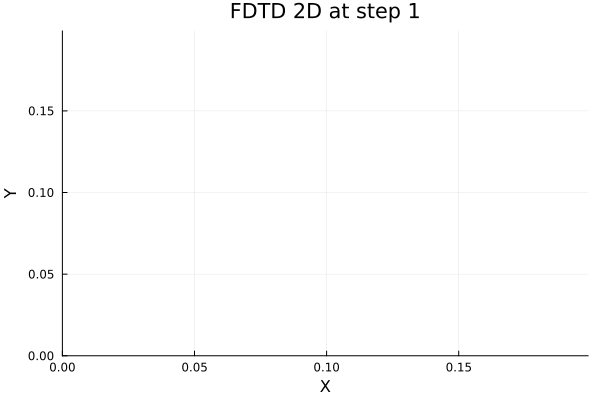

In [1]:
using Plots

# Constants
ε0 = 8.854187817e-12  # Permittivity of free space
μ0 = 1.256637061e-6   # Permeability of free space
c = 1 / sqrt(μ0 * ε0) # Speed of light in vacuum
Δx = 1e-3             # Spatial step (1mm)
Δt = Δx / (2 * c)     # Time step (satisfies Courant condition)

# Domain
size_x = 200           # Number of spatial steps in the x-direction
size_y = 200           # Number of spatial steps in the y-direction
E_x = zeros(size_x, size_y)  # Electric field component E_x
E_y = zeros(size_x, size_y)  # Electric field component E_y
H_z = zeros(size_x, size_y)  # Magnetic field component H_z

# Source
source_x = Int(size_x / 4)    # x-coordinate of the source
source_y = Int(size_y / 4)    # y-coordinate of the source
source_frequency = 2.5e9      # Frequency of the source (2.5 GHz)
ω = 2 * π * source_frequency  # Angular frequency

# Time stepping
time_steps = 1000  # Total number of time steps to simulate

# Create mesh grids for plotting
x = range(0, step=Δx, length=size_x)
y = range(0, step=Δx, length=size_y)

# Initialize animation
anim = Animation()

# FDTD loop
for n = 1:time_steps

    # Update electric fields (E_x and E_y)
    for i = 1:size_x-1
        for j = 1:size_y-1
            E_x[i, j+1] -= Δt / ε0 / Δx * (H_z[i, j+1] - H_z[i, j])
            E_y[i+1, j] += Δt / ε0 / Δx * (H_z[i+1, j] - H_z[i, j])
        end
    end

    # Update magnetic field (H_z)
    for i = 1:size_x-1
        for j = 1:size_y-1
            H_z[i, j] += Δt / μ0 / Δx * (E_y[i+1, j] - E_y[i, j]) - Δt / μ0 / Δx * (E_x[i, j+1] - E_x[i, j])
        end
    end

   

    # Source (a hard source)
    E_x[source_x, source_y] += sin(ω * n * Δt)

    # Visualize the fields at certain time steps
    # if n % 10 == 0
        contour_plot = contour(x, y, H_z', levels=20, xlabel="X", ylabel="Y", legend=false, c=:viridis)
        plot!(title="FDTD 2D at step $n")
        frame(anim, contour_plot)
    # end
end

# Save the animation as a gif
gif(anim, "fdtd_simulation-1.gif", fps=20)

In [9]:
for i = 0:2:10
    println(i)
end 

0
2
4
6
8
10
